In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
import pandas as pd
import rasterio
from rasterio import features

# Ruta al archivo shapefile de las AGEBs de la CDMX
agebs_shapefile_path = "C:/Users/MI18877/Auto-GPT/auto_gpt_workspace/Tesis/datos/shapefiles/ancilatorios/DENUE/denue_inegi_09_.shp"

# Leer el archivo shapefile de las AGEBs
agebs_gdf = gpd.read_file(agebs_shapefile_path)

# Calcular la envolvente convexa de los puntos
convex_hull = agebs_gdf.geometry.unary_union.convex_hull

# Filtrar los puntos que están dentro de la envolvente convexa
denue = agebs_gdf[agebs_gdf.geometry.within(convex_hull)]

In [2]:
# Crear un mapa de colores para las actividades económicas
unique_activities = denue["nombre_act"].unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(unique_activities)))
color_map = dict(zip(unique_activities, colors))

# Crear la figura y el eje para la visualización
fig, ax = plt.subplots(figsize=(120, 120))

# Establecer el color de los puntos en función del mapa de colores
for activity, color in color_map.items():
    denue[denue["nombre_act"] == activity].plot(ax=ax, color=color, markersize=0.8, label=activity)

# Crear una lista de objetos Patch con los colores y etiquetas correspondientes a cada actividad económica
legend_patches = [Patch(facecolor=color, edgecolor='k', label=activity) for activity, color in color_map.items()]

# Agregar la leyenda personalizada (desactivada por defecto debido a la gran cantidad de elementos)
# ax.legend(handles=legend_patches, loc='upper left', bbox_to_anchor=(1, 1), title='Actividades económicas')

# Agregar título y etiquetas
ax.set_title("Actividades económicas en la Ciudad de México")
ax.set_xlabel("Longitud")
ax.set_ylabel("Latitud")

# Mostrar la visualización
plt.show()

In [30]:
# 2. Filtrar actividades económicas con al menos 200 puntos
activity_counts = denue['nombre_act'].value_counts()
activities_to_keep = activity_counts[activity_counts >= 200].index

# Conservar solo las actividades económicas con al menos 200 puntos en la CDMX
denue = denue[denue['nombre_act'].isin(activities_to_keep)]

unique_activities = denue['nombre_act'].unique()
activities_df = pd.DataFrame(unique_activities, columns=['nombre_act'])

In [45]:
denue['nombre_act'].nunique()

252

In [32]:
pesos = {
    "Panificación tradicional": 4,
    "Elaboración de tortillas de maíz y molienda de nixtamal": 5,
    "Purificación y embotellado de agua": 3,
    "Elaboración de dulces, chicles y productos de confitería que no sean de chocolate": 3,
    "Confección, bordado y deshilado de productos textiles": 2,
    "Confección de prendas de vestir sobre medida": 2,
    "Confección en serie de uniformes": 3,
    "Elaboración de botanas": 3,
    "Confección en serie de otra ropa exterior de materiales textiles": 3,
    "Elaboración de helados y paletas": 3,
    "Edificación de vivienda unifamiliar": 4,
    "Instalaciones eléctricas en construcciones": 4,
    "Edificación de inmuebles comerciales y de servicios, excepto la supervisión": 4,
    "Instalaciones hidrosanitarias y de gas": 4,
    "Captación, tratamiento y suministro de agua realizados por el sector público": 3,
    "Impresión de formas continuas y otros impresos": 2,
    "Fabricación de productos de madera para la construcción": 3,
    "Fabricación de preparaciones farmacéuticas": 3,
    "Industrias conexas a la impresión": 2,
    "Fabricación de muebles de oficina y estantería": 2,
    "Otras industrias manufactureras": 2,
    "Fabricación de equipo no electrónico para uso médico, dental y para laboratorio": 3,
    "Maquinado de piezas metálicas para maquinaria y equipo en general": 2,
    "Fabricación de productos de herrería": 3,
    "Fabricación de muebles, excepto cocinas integrales, muebles modulares de baño y muebles de oficina y estantería": 2,
    "Comercio al por mayor de abarrotes": 4,
    "Comercio al por mayor de productos químicos para la industria farmacéutica y para otro uso industrial": 2,
    "Comercio al por mayor de maquinaria y equipo para otros servicios y para actividades comerciales": 3,
    "Comercio al por mayor de cemento, tabique y grava": 3,
    "Comercio al por mayor de partes y refacciones nuevas para automóviles, camionetas y camiones": 3,
    "Comercio al por mayor de ropa, bisutería y accesorios de vestir": 3,
    "Comercio al por mayor de equipo y material eléctrico": 3,
    "Comercio al por mayor de artículos y accesorios para diseño y pintura artística": 2,
    "Comercio al por mayor de artículos de perfumería y cosméticos": 3,
    "Comercio al por mayor de materiales metálicos para la construcción y la manufactura": 3,
    "Comercio al por mayor de desechos metálicos": 2,
    "Comercio al por mayor de desechos de plástico": 2,
    "Comercio al por mayor de artículos de papelería": 3,
    "Comercio al por mayor de artículos de joyería y relojes": 2,
    "Comercio al por mayor de maquinaria y equipo para la industria manufacturera": 3,
    "Comercio al por mayor de frutas y verduras frescas": 4,
    "Comercio al por mayor de otra maquinaria y equipo de uso general": 3,
    "Comercio al por mayor de fibras, hilos y telas": 2,
    "Comercio al por mayor de productos farmacéuticos": 3,
    "Comercio al por mayor de envases en general, papel y cartón para la industria": 2,
    "Comercio al por mayor de mobiliario, equipo e instrumental médico y de laboratorio": 2,
    "Comercio al por mayor de otras materias primas para otras industrias": 3,
    "Comercio al por mayor de equipo de telecomunicaciones, fotografía y cinematografía": 2,
    "Comercio al por mayor de medicamentos veterinarios y alimentos para animales, excepto mascotas": 2,
    "Comercio al por mayor de mobiliario, equipo, y accesorios de cómputo": 3,
    "Comercio al por mayor de madera para la construcción y la industria": 3,
    "Comercio al por mayor de desechos de papel y de cartón": 2,
    "Comercio al por mayor de otros materiales para la construcción, excepto de madera y metálicos": 3,
    "Comercio al por menor en tiendas de abarrotes, ultramarinos y misceláneas": 5,
    "Comercio al por menor de otros alimentos": 4,
    "Comercio al por menor de leche, otros productos lácteos y embutidos": 4,
    "Comercio al por menor en minisupers": 5,
    "Comercio al por menor de frutas y verduras frescas": 4,
    "Comercio al por menor de vinos y licores": 4,
    "Comercio al por menor de pisos y recubrimientos cerámicos": 3,
     "Comercio al por menor de ropa, excepto de bebé y lencería": 4,
    "Comercio al por menor de lentes": 3,
    "Comercio al por menor de plantas y flores naturales": 3,
    "Comercio al por menor de mobiliario, equipo y accesorios de cómputo": 3,
    "Comercio al por menor de artículos de papelería": 3,
    "Comercio al por menor en ferreterías y tlapalerías": 4,
    "Comercio al por menor de artículos para la limpieza": 4,
    "Comercio al por menor de carnes rojas": 4,
    "Comercio al por menor de semillas y granos alimenticios, especias y chiles secos": 3,
    "Comercio al por menor de gasolina y diesel": 5,
    "Comercio al por menor de teléfonos y otros aparatos de comunicación": 3,
    "Comercio al por menor de calzado": 4,
    "Comercio al por menor de lencería": 3,
    "Comercio al por menor de artículos y aparatos deportivos": 3,
    "Comercio al por menor de electrodomésticos menores y aparatos de línea blanca": 3,
    "Comercio al por menor de artículos de joyería y relojes": 2,
    "Comercio al por menor de ropa de bebé": 3,
    "Comercio al por menor de juguetes": 3,
    "Comercio al por menor de regalos": 3,
    "Comercio al por menor de otros artículos de uso personal": 3,
    "Comercio al por menor de dulces y materias primas para repostería": 4,
    "Comercio al por menor de bebidas no alcohólicas y hielo": 4,
    "Comercio al por menor de carne de aves": 4,
    "Comercio al por menor de cristalería, loza y utensilios de cocina": 3,
    "Comercio al por menor de artículos religiosos": 2,
    "Comercio al por menor de ropa de cuero y piel y de otros artículos de estos materiales": 2,
    "Comercio al por menor de otros artículos para la decoración de interiores": 3,
    "Comercio al por menor de pescados y mariscos": 4,
    "Comercio al por menor en supermercados": 5,
    "Comercio al por menor de pañales desechables": 3,
    "Comercio al por menor de telas": 3,
    "Comercio al por menor de disfraces, vestimenta regional y vestidos de novia": 2,
    "Comercio al por menor de artículos de perfumería y cosméticos": 4,
    "Comercio al por menor de artículos desechables": 3,
    "Comercio al por menor de muebles para el hogar": 3,
    "Comercio al por menor de bisutería y accesorios de vestir": 3,
    "Comercio al por menor de discos y casetes": 2,
    "Comercio al por menor en tiendas departamentales": 5,
    "Comercio al por menor de artículos de mercería y bonetería": 3,
    "Comercio al por menor de blancos": 3,
    "Comercio al por menor de revistas y periódicos": 2,
    "Comercio al por menor de artículos usados": 3,
    "Comercio al por menor de productos naturistas, medicamentos homeopáticos y de complementos alimenticios": 3,
    "Comercio al por menor de partes y refacciones usadas para automóviles, camionetas y camiones": 3,
    "Comercio al por menor de partes y refacciones nuevas para automóviles, camionetas y camiones": 4,
    "Comercio al por menor en tiendas de artesanías": 3,
    "Comercio al por menor de mascotas": 2,
    "Comercio al por menor de pintura": 3,
    "Comercio al por menor de paletas de hielo y helados": 4,
    "Comercio al por menor de libros": 3,
    "Farmacias sin minisúper": 4,
    "Farmacias con minisúper": 5,
    "Comercio al por menor de bicicletas": 3,
    "Comercio al por menor de cerveza": 4,
    "Comercio al por menor de alfombras, cortinas, tapices y similares": 2,
    "Comercio al por menor de automóviles y camionetas nuevos": 4,
    "Comercio al por menor de vidrios y espejos": 2,
    "Comercio al por menor de artículos ortopédicos": 3,
    "Comercio al por menor de aceites y grasas lubricantes, aditivos y similares para vehículos de motor": 3,
    "Comercio al por menor de motocicletas": 3,
    "Comercio al por menor de instrumentos musicales": 2,
    "Comercio al por menor de llantas y cámaras para automóviles, camionetas y camiones": 3,
    "Comercio al por menor de automóviles y camionetas usados": 4,
    "Comercio al por menor de sombreros": 2,
    "Otro autotransporte foráneo de carga general": 4,
    "Otros servicios de intermediación para el transporte de carga": 3,
    "Servicios de agencias aduanales": 4,
    "Transporte colectivo foráneo de pasajeros de ruta fija": 4,
    "Servicios de mudanzas": 3,
    "Servicios de mensajería y paquetería foránea": 4,
    "Banca múltiple": 5,
    "Sociedades financieras de objeto múltiple": 4,
    "Agentes, ajustadores y gestores de seguros y fianzas": 4,
    "Compañías de seguros": 5,
    "Operadores de servicios de telecomunicaciones inalámbricas": 4,
    "Operadores de servicios de telecomunicaciones alámbricas": 4,
    "Otros servicios de telecomunicaciones": 3,
    "Casas de empeño": 3,
    "Bibliotecas y archivos del sector público": 2,
    "Servicios de administración de bienes raíces": 3,
    "Alquiler sin intermediación de oficinas y locales comerciales": 3,
    "Alquiler sin intermediación de salones para fiestas y convenciones": 2,
    "Alquiler de mesas, sillas, vajillas y similares": 3,
    "Inmobiliarias y corredores de bienes raíces": 4,
    "Otros servicios relacionados con los servicios inmobiliarios": 3,
    "Servicios de contabilidad y auditoría": 4,
    "Servicios de diseño de sistemas de cómputo y servicios relacionados": 4,
    "Bufetes jurídicos": 4,
    "Servicios de consultoría en administración": 4,
    "Agencias de publicidad": 4,
    "Diseño gráfico": 3,
    "Servicios de fotografía y videograbación": 3,
    "Servicios veterinarios para mascotas prestados por el sector privado": 3,
    "Servicios de arquitectura": 4,
    "Servicios de ingeniería": 4,
    "Servicios de rotulación y otros servicios de publicidad": 3,
    "Otros servicios de consultoría científica y técnica": 4,
    "Servicios de apoyo para efectuar trámites legales": 3,
    "Notarías públicas": 4,
    "Otros servicios de apoyo a los negocios": 3,
    "Servicios de investigación y de protección y custodia, excepto mediante monitoreo": 4,
    "Suministro de personal permanente": 3,
    "Agencias de viajes": 3,
    "Agencias de colocación": 3,
    "Servicios de administración de negocios": 4,
    "Servicios de acceso a computadoras": 3,
    "Servicios de fotocopiado, fax y afines": 2,
    "Escuelas del sector privado que combinan diversos niveles de educación": 3,
    "Escuelas de educación preescolar del sector privado": 3,
    "Escuelas de educación superior del sector privado": 4,
    "Escuelas de educación primaria del sector privado": 3,
    "Servicios de profesores particulares": 2,
    "Escuelas del sector privado dedicadas a la enseñanza de oficios": 3,
    "Escuelas de idiomas del sector privado": 3,
    "Escuelas de educación primaria del sector público": 3,
    "Escuelas de educación media superior del sector público": 3,
    "Escuelas de educación secundaria general del sector público": 3,
    "Escuelas de educación preescolar del sector público": 3,
    "Escuelas de deporte del sector privado": 3,
    "Escuelas de educación superior del sector público": 4,
    "Escuelas del sector público de educación para necesidades especiales": 3,
    "Escuelas de arte del sector privado": 3,
    "Consultorios de medicina especializada del sector privado": 4,
    "Clínicas de consultorios médicos del sector público": 4,
    "Otros consultorios del sector privado para el cuidado de la salud": 4,
    "Consultorios de medicina general del sector privado": 4,
    "Clínicas de consultorios médicos del sector privado": 4,
    "Consultorios dentales del sector privado": 4,
    "Consultorios del sector privado de audiología y de terapia ocupacional, física y del lenguaje": 4,
    "Agrupaciones de autoayuda para alcohólicos y personas con otras adicciones": 3,
    "Consultorios de psicología del sector privado": 4,
    "Guarderías del sector privado": 3,
    "Guarderías del sector público": 3,
    "Servicios de orientación y trabajo social para la niñez y la juventud prestados por el sector público": 3,
    "Servicios de alimentación comunitarios prestados por el sector público": 3,
    "Consultorios de nutriólogos y dietistas del sector privado": 4,
    "Laboratorios médicos y de diagnóstico del sector privado": 4,
    "Consultorios de quiropráctica del sector privado": 4,
    "Consultorios de optometría": 4,
    "Venta de billetes de lotería, pronósticos deportivos y otros boletos de sorteo": 2,
    "Centros de acondicionamiento físico del sector privado": 3,
    "Centros de acondicionamiento físico del sector público": 3,
    "Casas de juegos electrónicos": 2,
    "Promotores del sector público de espectáculos artísticos, culturales, deportivos y similares que cuentan con instalaciones para presentarlos": 3,
    "Restaurantes con servicio de preparación de antojitos": 2,
    "Restaurantes con servicio de preparación de tacos y tortas": 2,
    "Restaurantes con servicio de preparación de pizzas, hamburguesas, hot dogs y pollos rostizados para llevar": 2,
    "Servicios de preparación de otros alimentos para consumo inmediato": 2,
    "Restaurantes de autoservicio": 2,
    "Restaurantes con servicio de preparación de alimentos a la carta o de comida corrida": 2,
    "Restaurantes que preparan otro tipo de alimentos para llevar": 2,
    "Restaurantes con servicio de preparación de pescados y mariscos": 2,
    "Cafeterías, fuentes de sodas, neverías, refresquerías y similares": 2,
    "Bares, cantinas y similares": 2,
    "Hoteles con otros servicios integrados": 3,
    "Hoteles sin otros servicios integrados": 3,
    "Lavado y lubricado de automóviles y camiones": 2,
    "Salones y clínicas de belleza y peluquerías": 2,
    "Asociaciones y organizaciones civiles": 1,
    "Asociaciones, organizaciones y cámaras de productores, comerciantes y prestadores de servicios": 1,
    "Asociaciones y organizaciones laborales y sindicales": 1,
    "Sanitarios públicos y bolerías": 1,
    "Reparación mecánica en general de automóviles y camiones": 2,
    "Instalación de cristales y otras reparaciones a la carrocería de automóviles y camiones": 2,
    "Otros servicios de reparación y mantenimiento de automóviles y camiones": 2,
    "Reparación menor de llantas": 2,
    "Reparación y mantenimiento de aparatos eléctricos para el hogar y personales": 2,
    "Estacionamientos y pensiones para vehículos automotores": 2,
    "Asociaciones y organizaciones religiosas": 1,
    "Hojalatería y pintura de automóviles y camiones": 2,
    "Otros servicios personales": 1,
    "Reparación y mantenimiento de otros artículos para el hogar y personales": 2,
    "Lavanderías y tintorerías": 2,
    "Reparación y mantenimiento de equipo electrónico de uso doméstico": 2,
    "Reparación y mantenimiento de otro equipo electrónico y de equipo de precisión": 2,
    "Servicios funerarios": 2,
    "Reparación y mantenimiento de motocicletas": 2,
    "Reparación y mantenimiento de maquinaria y equipo industrial": 2,
    "Reparación de calzado y otros artículos de piel y cuero": 2,
    "Reparación del sistema eléctrico de automóviles y camiones": 2,
    "Otras reparaciones mecánicas de automóviles y camiones": 2,
    "Tapicería de automóviles y camiones": 2,
    "Reparación de transmisiones de automóviles y camiones": 2,
    "Reparación de suspensiones de automóviles y camiones": 2,
    "Reparación y mantenimiento de bicicletas": 2,
    "Rectificación de partes de motor de automóviles y camiones": 2,
    "Cerrajerías": 2,
    "Reparación de tapicería de muebles para el hogar": 2,
    "Administración pública en general": 1,
    "Impartición de justicia y mantenimiento de la seguridad y el orden público": 1,
    "Actividades administrativas de instituciones de bienestar social": 1,
    "Regulación y fomento de actividades para mejorar y preservar el medio ambiente": 1
}

In [33]:
# Agregar una nueva columna 'peso' al GeoDataFrame y asignar los pesos correspondientes
denue['peso'] = denue['nombre_act'].map(pesos)

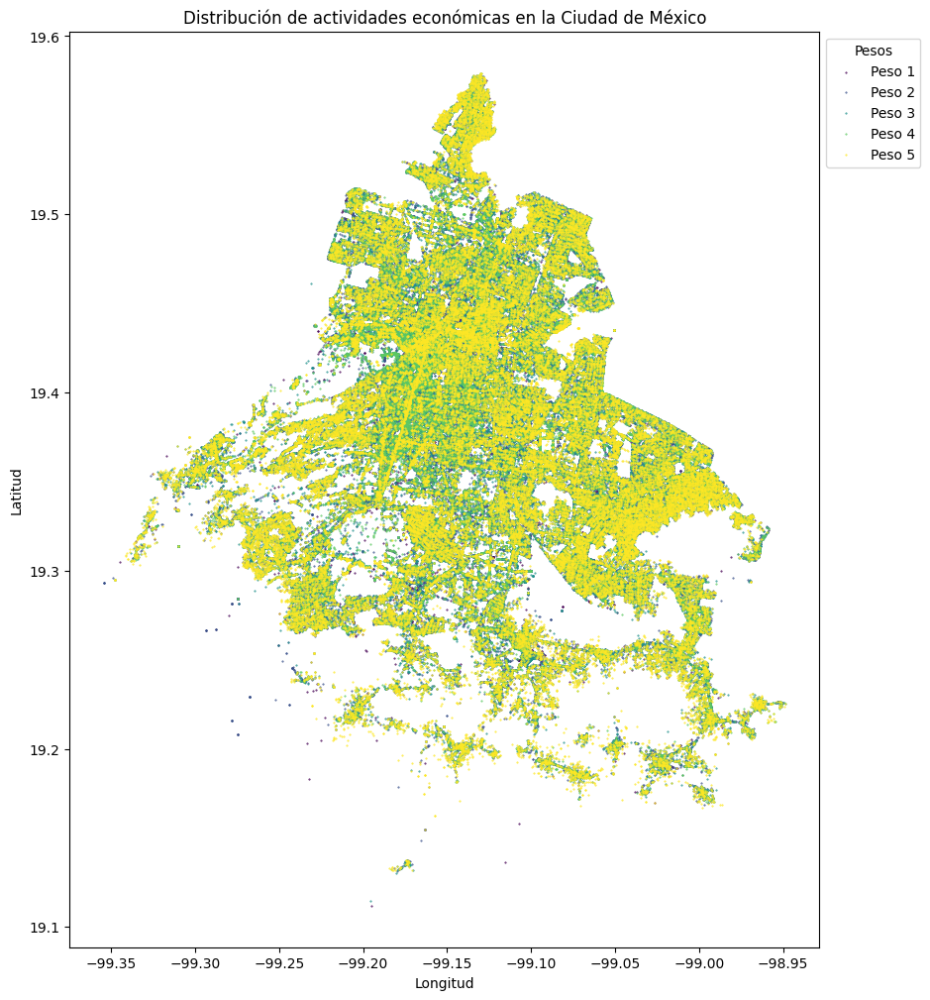

In [66]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Crear un mapa de colores para los valores únicos en 'peso'
unique_pesos = sorted(denue["peso"].unique())
colors = plt.cm.viridis(np.linspace(0, 1, len(unique_pesos)))
color_map = dict(zip(unique_pesos, colors))

# Crear la figura y el eje para la visualización
fig, ax = plt.subplots(figsize=(12, 12))

# Visualizar los puntos en función del valor de 'peso'
for peso, color in color_map.items():
    denue[denue["peso"] == peso].plot(ax=ax, color=color, markersize=0.2, label=f"Peso {peso}")

# Agregar título y etiquetas
ax.set_title("Distribución de actividades económicas en la Ciudad de México")
ax.set_xlabel("Longitud")
ax.set_ylabel("Latitud")

# Agregar leyenda
ax.legend(title="Pesos", loc='upper left', bbox_to_anchor=(1, 1))

# Mostrar la visualización
plt.show()


In [16]:
# Transformar los datos a un SCR que utilice metros como unidades (EPSG:32614)
denue_meters = denue.to_crs(epsg=32614)

# Calcular límites de la capa vectorial en metros
x_min, y_min, x_max, y_max = denue_meters.total_bounds

# Calcular dimensiones del raster
resolution = 30
width = int(round((x_max - x_min) / resolution))
height = int(round((y_max - y_min) / resolution))

print("x_min:", x_min, "y_min:", y_min, "x_max:", x_max, "y_max:", y_max)
print("width:", width, "height:", height)

x_min: 310918.40596512903 y_min: 2112475.606518687 x_max: 505482.582556363 y_max: 2270328.041293059
width: 6485 height: 5262


In [ ]:
import numpy as np
import rasterio
from rasterio import features

# Función para rasterizar un GeoDataFrame
from shapely.geometry import Polygon

def rasterize_geodataframe(geodataframe, attribute, resolution=30):
    # Calcular la envolvente convexa de los puntos
    convex_hull = geodataframe.geometry.unary_union.convex_hull
    # Filtrar los puntos que están dentro de la envolvente convexa
    geodataframe = geodataframe[geodataframe.geometry.within(convex_hull)]

    # Calcular límites de la capa vectorial
    x_min, y_min, x_max, y_max = geodataframe.total_bounds

    # Calcular el ancho y el alto del raster basado en la resolución
    width = int((x_max - x_min) / resolution)
    height = int((y_max - y_min) / resolution)

    # Crear una matriz vacía con las dimensiones del raster
    raster_shape = (height, width)
    out_raster = np.zeros(raster_shape, dtype=np.uint8)

    # Calcular la transformación de coordenadas
    transform = rasterio.transform.from_bounds(x_min, y_min, x_max, y_max, width, height)

    # Rasterizar los puntos
    shapes = ((geom, value) for geom, value in zip(geodataframe.geometry, geodataframe[attribute]))
    burned = features.rasterize(shapes=shapes, fill=255, out=out_raster, transform=transform, dtype=np.uint8, all_touched=True)

    return burned, transform



# Rasterizar los puntos según la variable 'peso', utilizando las dimensiones calculadas previamente
raster, transform = rasterize_geodataframe(denue_meters, 'peso', resolution=30)


# Guardar el raster en un archivo GeoTIFF temporal

output_raster_path = 'raster_DENUE.tif'

with rasterio.open(output_raster_path, 'w', driver='GTiff', width=raster.shape[1], height=raster.shape[0],
                  count=1, crs=denue_meters.crs, transform=transform, dtype=raster.dtype) as dst:
    dst.write(raster, indexes=1)



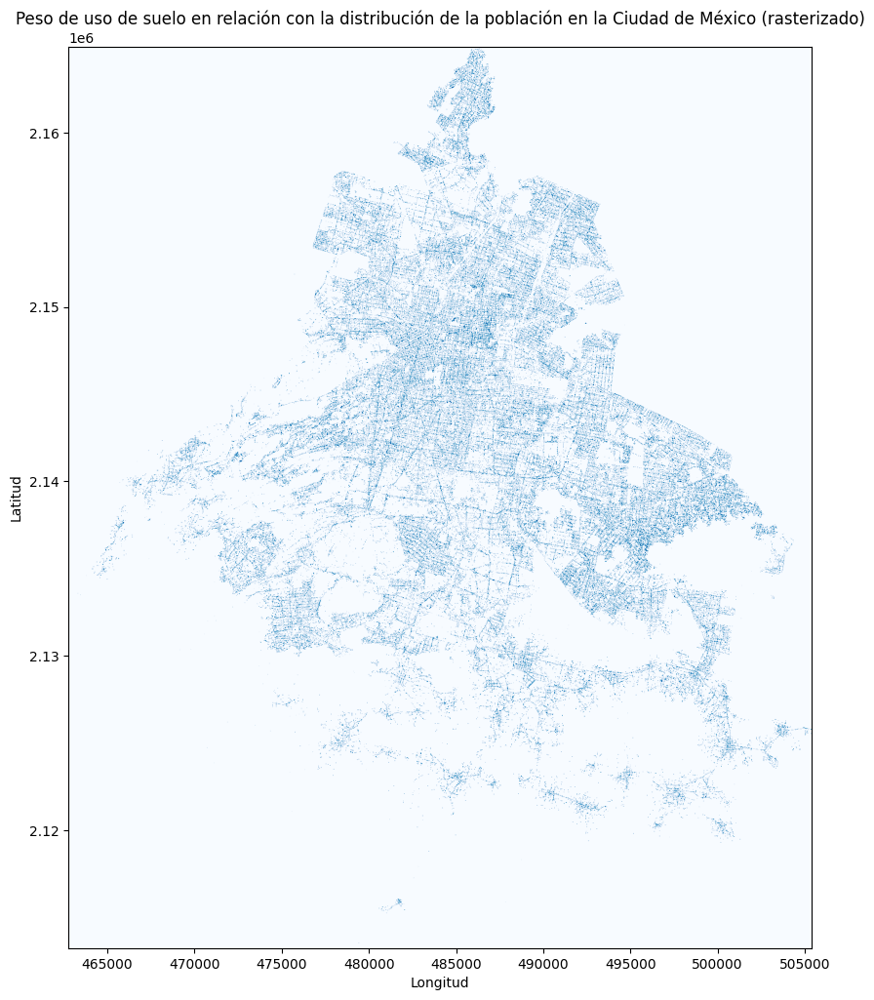

In [64]:
from rasterio.plot import show

# Leer el archivo raster creado previamente
with rasterio.open(output_raster_path) as src:
    saved_raster_data = src.read(1)
    raster_transform = src.transform

# Visualizar el archivo rasterizado
fig, ax = plt.subplots(figsize=(120, 120))

show(saved_raster_data, transform=raster_transform, ax=ax, cmap=plt.cm.Blues)

ax.set_title("Peso de uso de suelo en relación con la distribución de la población en la Ciudad de México (rasterizado)")
ax.set_xlabel("Longitud")
ax.set_ylabel("Latitud")

plt.show()